# Introduction
##### prepared by [Edward Goh](https://www.linkedin.com/in/edward-goh-b98b55126/)


This is a Exploratory data analysis report of the Youtube Trending Video dataset. This [dataset](https://www.kaggle.com/datasnaek/youtube-new) contains trending youtube video statistics data from 10 countries.

License: CC0 Public Domain

The data is extracted through a script via youtube api. More info can be found in the [dataset landing page](https://www.kaggle.com/datasnaek/youtube-new)


# Objectives

The objective of this case study is to (adopted from tasks in the dataset [tasks](https://www.kaggle.com/datasnaek/youtube-new/tasks) page):

1. Find out correlation between views and likes
2. Visualize distribution of the available attributes(likes, dislikes, views, comments)


The data that is used will be the Canada Youtube data for now. This is to keep to project simple. 

In future, a pipeline might be prepared to go through all 10 datasets for comparisons between different countries.



In [120]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import os
from datetime import datetime
init_notebook_mode(connected=True)
cf.go_offline()
import json
from plotly import graph_objects as go
from plotly.subplots import make_subplots

%matplotlib inline

In [3]:
# Reading in csv file into dataframe

canada_data_filepath = './archive/CAvideos.csv'
df = pd.read_csv(canada_data_filepath)

#Formatting datetime into correct data type
df.trending_date = pd.to_datetime(df.trending_date, format='%y.%d.%m')


Let's take a look at the dataset, get to know the data, check for any NaN values, unique values etc.

In [4]:
# Checking for na values
df.isna().any()

video_id                  False
trending_date             False
title                     False
channel_title             False
category_id               False
publish_time              False
tags                      False
views                     False
likes                     False
dislikes                  False
comment_count             False
thumbnail_link            False
comments_disabled         False
ratings_disabled          False
video_error_or_removed    False
description                True
dtype: bool

In [5]:
#Checking the amount of na values in description column

df.description.isna().sum()

1296

There are a few observations that we can draw from the initial explore:
1.  There are 1296 NaN values in the description column. However, in this notebook the description data will not be utilized. This will not affect the analysis. If space complexity is a concern, we could remove the column from analyis as well.


2. Some of the videos appear more than once, this can be seen that there are only 24104 unique values as compared to 40881 total rows. However, it is not cleaned as it doesn't affect the objectives, such as distribution data, or categorical data


3. From the dataset, it seems that the category_id will be useful for analysis, but there is no reference as to which id represents what category. However, with the dataset there is a json file that contains exactly this information. The information is extracted out and added into the dataframe

In [7]:
#Retrieving category_id and category data from json

category_id_filepath = './archive/US_category_id.json'
category_id_json = open(category_id_filepath)

raw_category_data = json.load(category_id_json)

category_data = {}

for item in raw_category_data['items']:
    category_data[int(item['id'])] = item['snippet']['title']

# Mapping category data into the dataframe

df['category'] = df['category_id'].apply(lambda x: category_data.get(x, 'N/A'))

Now that we understand the landscape of our data, we can start visualizing the data to help us understand it even more. 


Let's take a look at the correlation, and then the distribution of the attributes as a whole.

<AxesSubplot:>

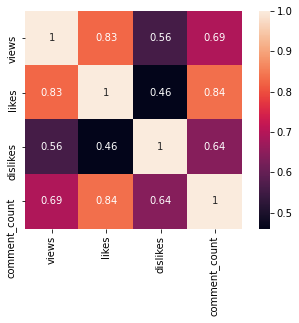

In [9]:
numerical_cols = ['views','likes','dislikes','comment_count']

sns.heatmap(df[numerical_cols].corr(),square=True, annot=True)

In [11]:
px.histogram(df, x=numerical_cols, log_y=True)

Through the interactive plot, we can see that for all of the 4 attributes that are of interest, the views, likes, dislikes and comment count, the distribution is left skewed. Let's take a look at the variance.

In [12]:
df.var()

category_id               4.590135e+01
views                     1.149829e+13
likes                     1.760651e+10
dislikes                  3.613181e+08
comment_count             4.656541e+08
comments_disabled         1.405787e-02
ratings_disabled          6.778276e-03
video_error_or_removed    6.600335e-04
dtype: float64

The variance for these 4 columns are in powers > 8 -  13, hence, using log distribution to normalize the plots should be a better way for us to understand and represent the distribution.

For more info on when and why to use log distributions, please read [this](https://stats.stackexchange.com/questions/107610/what-is-the-reason-the-log-transformation-is-used-with-right-skewed-distribution).

In [64]:
#Preparing data
numerical_cols = ['views','likes', 'dislikes', 'comment_count']
log_numerical_cols = []

for col in numerical_cols:
    df[col+'_log'] = np.log(df[col] + 1)
    log_numerical_cols.append(col+'_log')

fig_distribution = px.histogram(df, x=log_numerical_cols)

fig_distribution

Now the histogram is normalized and easier to understand. 

In [30]:
sum_list = {}

for col in numerical_cols:
    sum_list[col] = df[col].sum()

    
sum_array = np.array(sum_list)
px.pie(values=sum_list, names=numerical_cols,title='Sum of attributes')

Let us not forget that the histogram is normalized, here is a pie chart to show the actual sum of views, likes, dislikes, comments.


Now let's take a look at the data when we separate them by categories. The views count is exponentially more than other attributes.

Let's explore 
1. Which categories have more entries,
2. The distribution of the attributes in each of the category

In [38]:
px.histogram(df, x='category', color_discrete_sequence=['#369aff'], title='No. of videos in each category')

In [36]:
px.pie(df, names='category', values='views', title='Total Views in each category')

# px.pie(df, names='category', values='likes_log')

From the pie chart, it can be seen that there are almost the same amount of total views for the Music and Entertainment category. However, from the bar chart showing the no. of videos, there are a lot less music videos. This implies that people usually watch/listen to music videos multiple times, which makes sense.

Let's explore the distribution of each attribute within it's own category. We will create a summary dataset that is grouped by the category.

In [103]:
summary_df = df.groupby(by='category',).sum()
cols_to_keep = ['views', 'likes', 'dislikes', 'comment_count',
       'comments_disabled', 'ratings_disabled', 'video_error_or_removed']
summary_df = summary_df[cols_to_keep]

fig = px.bar(summary_df,
       x=summary_df.index, 
       y=numerical_cols, 
       barmode='group',
       log_y=True,title='Total Value by Video Category')

fig.update_layout(yaxis={'exponentformat': 'E'})

Checking the top 3 video category, by views, likes, and comment_count.

In [191]:
summary_df.sort_values(by='views',ascending=False).head(3)

,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed,L/V_ratio,D/V_ratio,C/V_ratio,L/D_ratio
category,,,,,,,,,,,
Entertainment,13671215509,387245433,25791583,55313036,215,128,8,0.028326,0.001887,0.004046,15.014411
Music,13179850194,564447530,22098190,52435252,20,12,1,0.042827,0.001677,0.003978,25.542704
Comedy,3708438785,196046674,5372515,19638776,9,0,2,0.052865,0.001449,0.005296,36.490670


In [192]:
summary_df.sort_values(by='likes',ascending=False).head(3)

,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed,L/V_ratio,D/V_ratio,C/V_ratio,L/D_ratio
category,,,,,,,,,,,
Music,13179850194,564447530,22098190,52435252,20,12,1,0.042827,0.001677,0.003978,25.542704
Entertainment,13671215509,387245433,25791583,55313036,215,128,8,0.028326,0.001887,0.004046,15.014411
Comedy,3708438785,196046674,5372515,19638776,9,0,2,0.052865,0.001449,0.005296,36.490670


In [193]:
summary_df.sort_values(by='comment_count',ascending=False).head(3)

,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed,L/V_ratio,D/V_ratio,C/V_ratio,L/D_ratio
category,,,,,,,,,,,
Entertainment,13671215509,387245433,25791583,55313036,215,128,8,0.028326,0.001887,0.004046,15.014411
Music,13179850194,564447530,22098190,52435252,20,12,1,0.042827,0.001677,0.003978,25.542704
Comedy,3708438785,196046674,5372515,19638776,9,0,2,0.052865,0.001449,0.005296,36.490670


From the bar chart above, it can be seen that the general pattern is Views having the largest value, followed by likes, then comment and lastly dislikes. However, the differences between the attributes are not the same in each category. Some calculated columns, such as like/dislike ratio, can be prepared to analyze this further. 

From the sorted data, it can be seen that the 3 most popular category are the Entertainemnt, Music and Comedy category.

In [144]:
#Adding some calculated columns

summary_df['L/V_ratio'] = summary_df['likes']/summary_df['views']
summary_df['D/V_ratio'] = summary_df['dislikes']/summary_df['views']
summary_df['C/V_ratio'] = summary_df['comment_count']/summary_df['views']
summary_df['L/D_ratio'] = summary_df['likes']/summary_df['dislikes']

In [161]:
fig = px.bar(summary_df, y=['L/V_ratio', 'D/V_ratio','C/V_ratio'], 
             barmode='group', 
             hover_data={'views':True},
             title='Like, Dislike and Comments over Views Ratio')
fig

In [181]:
px.bar(summary_df, y=['L/D_ratio','views'], title='Like Dislike Ratio',barmode='group',log_y=True)

From the plots, it seems that the ratios does not have very strong correlation to the total views. Let's verify this with a correlation heatmap

<AxesSubplot:>

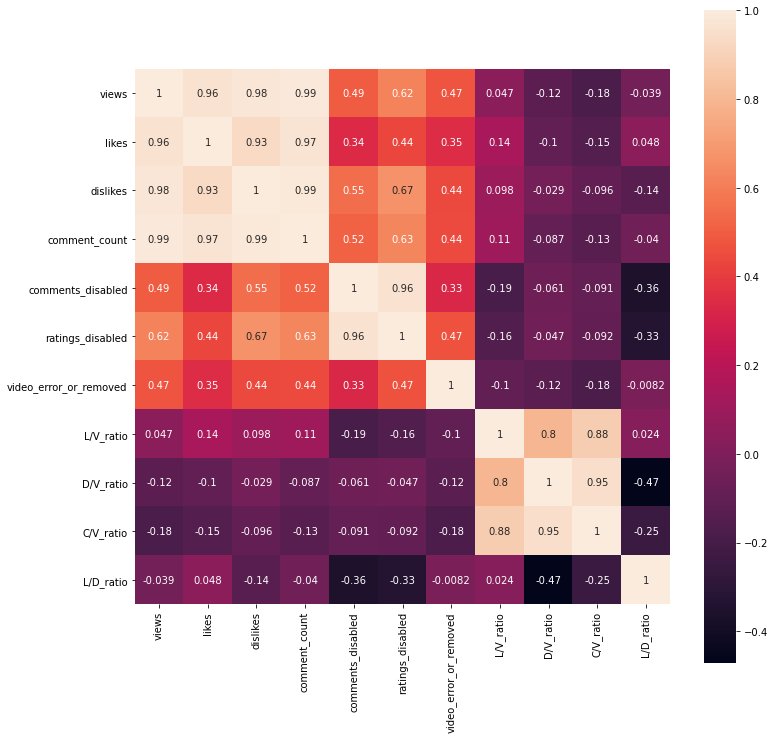

In [168]:
plt.figure(figsize=(12,12))
sns.heatmap(summary_df.corr(),square=True,annot=True)

# Summary

In this EDA, there are some findings that are obtained through this data analysis.

Firstly, the correlation heatmap showed that the strongest correlation was between Likes and Views , corr = 0.83 and between Likes and Comment Count, corr = 0.84.

After that, the distribution for all of the attributes were visualized. The log distibution was used to normalize the values as there were attributes that had high variance and exponential values. Generally, there was always more no. of views, then followed in order with the no. of likes, no. of comments, and no. of dislikes. This is probably because most people only view the videos without any interaction.

Following that, the total no. of videos and total no. of views were visualized and analysed. The analysis showed that the for the Music videos category, the no. of videos were less by 3.5 times but the total no. of views were similar with the Entertainment videos category. This is because music videos are much more repeated compared to other video categories.

By checking the top 3 video categories by sorting the dataset with views, likes and comments, it is safe to say that in Canada, the **top 3 video categories are the Entertainment, Music and Comedy** categories.

Lastly, the Like/Views, Dislike/Views, Comment_count/Views, and Like/Dislike ratio were computed and added into the dataset. It showed that the ratio does not have a huge correlation as to how good the category is performing. 

# Author's Note

This is an EDA notebook that I have prepared to be part of my portfolio. It showcases that I am able to perform junior level data analysis, and also able to use the relevant data manipulation and visualization libraries.

Please comment and help to suggests areas where I can study more and improve myself. Thank you!